
# 1. Setup



In [2]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


pd.set_option('display.max_columns', None)
pd.options.mode.copy_on_write = True

# Using the URL for the file
spotify_original = pd.read_csv("spotify_data/dataset.csv")

spotify_original_reshape = spotify_original.iloc[:,1:]

# 2. Data Cleaning


*   Todo 1
*   Todo 2



In [3]:
#spotify_original_reshape.head(20)
#spotify_original.shape
spotify_original_reshape




,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,False,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,False,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,False,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,False,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


In [4]:
spotify_original_reshape['track_name'].describe()

count              113999
unique              73608
top       Run Rudolph Run
freq                  151
Name: track_name, dtype: object

In [5]:
spotify_original_reshape['popularity'].describe()

count    114000.000000
mean         33.238535
std          22.305078
min           0.000000
25%          17.000000
50%          35.000000
75%          50.000000
max         100.000000
Name: popularity, dtype: float64

In [6]:
spotify_original_reshape['track_genre'].describe()

count       114000
unique         114
top       acoustic
freq          1000
Name: track_genre, dtype: object

In [7]:
missing_track = spotify_original_reshape[spotify_original_reshape['track_id'] == '1kR4gIb7nGxHPI3D2ifs59']
print(missing_track)

                     track_id artists album_name track_name  popularity  \
65900  1kR4gIb7nGxHPI3D2ifs59     NaN        NaN        NaN           0   

       duration_ms  explicit  danceability  energy  key  loudness  mode  \
65900            0     False         0.501   0.583    7     -9.46     0   

       speechiness  acousticness  instrumentalness  liveness  valence  \
65900       0.0605          0.69           0.00396    0.0747    0.734   

         tempo  time_signature track_genre  
65900  138.391               4       k-pop  


In [8]:
# Cleaning rows with missing information
missing_data_rows = spotify_original_reshape[spotify_original_reshape.isnull().any(axis=1)]

missing_data_rows

spotify_original_reshape_drop = spotify_original_reshape.dropna()

print(spotify_original_reshape.shape)
print(spotify_original_reshape_drop.shape)

(114000, 20)
(113999, 20)


In [9]:
#clean track_name and artists columns by stripping spaces and converting to lowercase
spotify_original_reshape_drop['track_name_clean'] = spotify_original_reshape_drop['track_name'].str.strip().str.lower()
spotify_original_reshape_drop['artists_clean'] = spotify_original_reshape_drop['artists'].str.strip().str.lower()

#priority list for genres to handle duplicates
genre_priority = ['pop', 'rock', 'hip hop', 'rap', 'reggaeton', 'latin', 'electronic', 'r&b', 'reggae', 'dance', 'classical']
spotify_original_reshape_drop['genre_priority'] = spotify_original_reshape_drop['track_genre'].apply(lambda x: genre_priority.index(x) if x in genre_priority else len(genre_priority))

#sort the dataset by track_name, artists, genre priority, popularity, and duration
spotify_data_sorted = spotify_original_reshape_drop.sort_values(by=['track_name_clean', 'artists_clean', 'genre_priority', 'popularity', 'duration_ms'],
                                                                ascending=[True, True, True, True, False])

#remove duplicates
spotify_cleaned = spotify_data_sorted.drop_duplicates(subset=['track_name_clean', 'artists_clean'], keep='first')

# checking size
print(f"Shape of the dataset before cleaning: {spotify_original_reshape_drop.shape}")
print(f"Shape of the dataset after cleaning: {spotify_cleaned.shape}")

# removing extra columns added
spotify_cleaned_final = spotify_cleaned.drop(columns=['track_name_clean', 'artists_clean', 'genre_priority'])

# Fcheck size again
print(f"Shape of the dataset after removing extra columns: {spotify_cleaned_final.shape}")


spotify_cleaned_final


Shape of the dataset before cleaning: (113999, 23)
Shape of the dataset after cleaning: (81206, 23)
Shape of the dataset after removing extra columns: (81206, 20)


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
36750,0fROT4kK5oTm8xO8PX6EJF,Rilès,!I'll Be Back!,!I'll Be Back!,52,178533,True,0.823,0.6120,1,-7.767,1,0.2480,0.1680,0.000000,0.1090,0.6880,142.959,4,french
92751,1hH0t381PIXmUVWyG1Vj3p,Brian Hyland,The Bashful Blond,"""A"" You're Adorable",39,151680,False,0.615,0.3750,0,-10.362,0,0.0319,0.4820,0.000000,0.1110,0.9220,110.720,4,rockabilly
66996,73lXf5if6MWVWnsgXhK8bd,Little Apple Band,Sesame Street and Friends,"""C"" is for Cookie",8,86675,False,0.664,0.6110,3,-8.687,1,0.0886,0.1200,0.000000,0.0408,0.7580,118.443,4,kids
101161,0jmz4aHEIBCRgrcV2xEkwB,Traditional;Sistine Chapel Choir;Massimo Palom...,Classical Christmas,"""Christe, Redemptor omnium""",0,289133,False,0.111,0.0568,10,-28.053,1,0.0551,0.9900,0.697000,0.1100,0.0395,169.401,1,sleep
82584,5Zx0Rrkn5RFBMD2PRxX3mI,Dillinger Four,C I V I L W A R,"""Contemplate This on the Tree of Woe.""",24,180706,False,0.565,0.9770,11,-3.592,1,0.0546,0.0282,0.001320,0.4330,0.3870,106.478,4,power-pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65756,2oVHb8wyg6oC2iNpGBNvx1,HEIZE,Hotel del Luna (Original Television Soundtrack...,내 맘을 볼 수 있나요,63,225785,False,0.397,0.1660,9,-10.678,1,0.0349,0.8840,0.000000,0.1000,0.1310,134.708,4,k-pop
65859,4kIpBfvK44bxqX7zo8K1oP,Gaho,ITAEWON CLASS (Original Television Soundtrack)...,시작,65,202440,False,0.591,0.8180,4,-3.532,1,0.0730,0.1720,0.000000,0.1260,0.5740,108.107,4,k-pop
75903,4mHc7LUlO3k6AXeFV2EiJK,Yiruma,Yiruma Official Album 'Piano Therapy' (The Ori...,약속 (Piano Solo),37,144533,False,0.504,0.1430,1,-18.713,1,0.0701,0.9800,0.922000,0.1240,0.0584,148.786,4,new-age
79554,0tQesiSZJQOdHeAC7r59us,GODA,One Punch Man (Original Soundtrack),원펀맨 Theme - Sad Theme,37,228000,False,0.542,0.3370,2,-16.088,1,0.0539,0.9850,0.933000,0.1470,0.4430,159.951,4,piano


# 3. KNN

In [44]:
"""
We will continue choosing mode as our response variable and apply KNN classification
"""

from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# print all columns
print(spotify_cleaned_final.columns)

print(spotify_cleaned_final.shape)
spotify_knn = spotify_cleaned_final
print(spotify_knn.shape)

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')
(81206, 20)
(81206, 20)


Encoding Explicit column to boolean values

In [45]:

print(spotify_knn.shape)
count = spotify_knn['track_genre'].isna().sum()

total  = spotify_knn['track_genre'].size



print(f"Nan: {count}, Total: {total}")

(81206, 20)
Nan: 0, Total: 81206


In [46]:
spotify_knn['explicit'] = spotify_knn['explicit'].astype(int)

In [47]:
spotify_knn.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
36750,0fROT4kK5oTm8xO8PX6EJF,Rilès,!I'll Be Back!,!I'll Be Back!,52,178533,1,0.823,0.6120,1,-7.767,1,0.2480,0.1680,0.00000,0.1090,0.6880,142.959,4,french
92751,1hH0t381PIXmUVWyG1Vj3p,Brian Hyland,The Bashful Blond,"""A"" You're Adorable",39,151680,0,0.615,0.3750,0,-10.362,0,0.0319,0.4820,0.00000,0.1110,0.9220,110.720,4,rockabilly
66996,73lXf5if6MWVWnsgXhK8bd,Little Apple Band,Sesame Street and Friends,"""C"" is for Cookie",8,86675,0,0.664,0.6110,3,-8.687,1,0.0886,0.1200,0.00000,0.0408,0.7580,118.443,4,kids
101161,0jmz4aHEIBCRgrcV2xEkwB,Traditional;Sistine Chapel Choir;Massimo Palom...,Classical Christmas,"""Christe, Redemptor omnium""",0,289133,0,0.111,0.0568,10,-28.053,1,0.0551,0.9900,0.69700,0.1100,0.0395,169.401,1,sleep
82584,5Zx0Rrkn5RFBMD2PRxX3mI,Dillinger Four,C I V I L W A R,"""Contemplate This on the Tree of Woe.""",24,180706,0,0.565,0.9770,11,-3.592,1,0.0546,0.0282,0.00132,0.4330,0.3870,106.478,4,power-pop


One hot encoding for music genre

In [48]:
from sklearn.preprocessing import OneHotEncoder

import pandas as pd


unique_genres = set()
test = spotify_knn['track_genre'].unique()
for genre_list in spotify_knn['track_genre']:
    genres = genre_list.split(",")
    for genre in genres:
        unique_genres.add(genre)

# Create a one-hot encoding for the genre column
encoder = OneHotEncoder()
encoder.fit([[genre] for genre in unique_genres])

# Encode the genre data
encoded_genres = []
for genres in spotify_knn['track_genre']:
    genres = genres.split(",")
    one_hot = [0 if genre not in genres else 1 for genre in unique_genres]
    encoded_genres.append(one_hot)
    
df = pd.DataFrame(encoded_genres, columns=list(unique_genres))
df.head()

,sad,party,latin,metalcore,minimal-techno,mandopop,disney,electro,goth,iranian,brazil,detroit-techno,dancehall,trance,happy,j-pop,techno,spanish,black-metal,swedish,malay,garage,indie,drum-and-bass,gospel,trip-hop,funk,mpb,heavy-metal,alt-rock,sertanejo,hip-hop,romance,classical,j-idol,rock,pagode,death-metal,punk-rock,kids,edm,psych-rock,jazz,anime,world-music,grindcore,blues,honky-tonk,rockabilly,punk,tango,children,comedy,synth-pop,alternative,singer-songwriter,soul,indie-pop,bluegrass,disco,piano,j-dance,industrial,guitar,folk,grunge,breakbeat,rock-n-roll,groove,samba,hardcore,deep-house,electronic,dance,study,opera,progressive-house,british,country,ska,power-pop,new-age,sleep,house,chicago-house,pop,turkish,afrobeat,reggaeton,k-pop,reggae,hardstyle,metal,salsa,emo,j-rock,indian,show-tunes,acoustic,pop-film,idm,chill,latino,cantopop,german,hard-rock,club,r-n-b,french,forro,dubstep,ambient,dub
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Encoding Dataset

In [49]:
test = spotify_knn.drop(columns=['track_genre'])
print(spotify_knn.shape)
print(df.shape)

test = test.reset_index(drop=True)
df = df.reset_index(drop=True)

combined_df = pd.concat([test, df], axis=1)

combined_df.head()


(81206, 20)
(81206, 113)


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,sad,party,latin,metalcore,minimal-techno,mandopop,disney,electro,goth,iranian,brazil,detroit-techno,dancehall,trance,happy,j-pop,techno,spanish,black-metal,swedish,malay,garage,indie,drum-and-bass,gospel,trip-hop,funk,mpb,heavy-metal,alt-rock,sertanejo,hip-hop,romance,classical,j-idol,rock,pagode,death-metal,punk-rock,kids,edm,psych-rock,jazz,anime,world-music,grindcore,blues,honky-tonk,rockabilly,punk,tango,children,comedy,synth-pop,alternative,singer-songwriter,soul,indie-pop,bluegrass,disco,piano,j-dance,industrial,guitar,folk,grunge,breakbeat,rock-n-roll,groove,samba,hardcore,deep-house,electronic,dance,study,opera,progressive-house,british,country,ska,power-pop,new-age,sleep,house,chicago-house,pop,turkish,afrobeat,reggaeton,k-pop,reggae,hardstyle,metal,salsa,emo,j-rock,indian,show-tunes,acoustic,pop-film,idm,chill,latino,cantopop,german,hard-rock,club,r-n-b,french,forro,dubstep,ambient,dub
0,0fROT4kK5oTm8xO8PX6EJF,Rilès,!I'll Be Back!,!I'll Be Back!,52,178533,1,0.823,0.6120,1,-7.767,1,0.2480,0.1680,0.00000,0.1090,0.6880,142.959,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,1hH0t381PIXmUVWyG1Vj3p,Brian Hyland,The Bashful Blond,"""A"" You're Adorable",39,151680,0,0.615,0.3750,0,-10.362,0,0.0319,0.4820,0.00000,0.1110,0.9220,110.720,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,73lXf5if6MWVWnsgXhK8bd,Little Apple Band,Sesame Street and Friends,"""C"" is for Cookie",8,86675,0,0.664,0.6110,3,-8.687,1,0.0886,0.1200,0.00000,0.0408,0.7580,118.443,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0jmz4aHEIBCRgrcV2xEkwB,Traditional;Sistine Chapel Choir;Massimo Palom...,Classical Christmas,"""Christe, Redemptor omnium""",0,289133,0,0.111,0.0568,10,-28.053,1,0.0551,0.9900,0.69700,0.1100,0.0395,169.401,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,5Zx0Rrkn5RFBMD2PRxX3mI,Dillinger Four,C I V I L W A R,"""Contemplate This on the Tree of Woe.""",24,180706,0,0.565,0.9770,11,-3.592,1,0.0546,0.0282,0.00132,0.4330,0.3870,106.478,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Normalizing Data

In [50]:
def norm_col(col):
    max_d = combined_df[col].max()
    min_d = combined_df[col].min()
    combined_df[col] = (combined_df[col]-min_d)/(max_d-min_d)

In [51]:
num_types = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numeric = combined_df.select_dtypes(include=num_types)

for col in numeric.columns:
    if col != 'year':
        norm_col(col)



In [52]:
combined_df.head()


,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,sad,party,latin,metalcore,minimal-techno,mandopop,disney,electro,goth,iranian,brazil,detroit-techno,dancehall,trance,happy,j-pop,techno,spanish,black-metal,swedish,malay,garage,indie,drum-and-bass,gospel,trip-hop,funk,mpb,heavy-metal,alt-rock,sertanejo,hip-hop,romance,classical,j-idol,rock,pagode,death-metal,punk-rock,kids,edm,psych-rock,jazz,anime,world-music,grindcore,blues,honky-tonk,rockabilly,punk,tango,children,comedy,synth-pop,alternative,singer-songwriter,soul,indie-pop,bluegrass,disco,piano,j-dance,industrial,guitar,folk,grunge,breakbeat,rock-n-roll,groove,samba,hardcore,deep-house,electronic,dance,study,opera,progressive-house,british,country,ska,power-pop,new-age,sleep,house,chicago-house,pop,turkish,afrobeat,reggaeton,k-pop,reggae,hardstyle,metal,salsa,emo,j-rock,indian,show-tunes,acoustic,pop-film,idm,chill,latino,cantopop,german,hard-rock,club,r-n-b,french,forro,dubstep,ambient,dub
0,0fROT4kK5oTm8xO8PX6EJF,Rilès,!I'll Be Back!,!I'll Be Back!,0.52,0.032503,1.0,0.835533,0.6120,0.090909,0.772506,1.0,0.256995,0.168675,0.00000,0.1090,0.691457,0.587409,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,1hH0t381PIXmUVWyG1Vj3p,Brian Hyland,The Bashful Blond,"""A"" You're Adorable",0.39,0.027367,0.0,0.624365,0.3750,0.000000,0.724507,0.0,0.033057,0.483936,0.00000,0.1110,0.926633,0.454941,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,73lXf5if6MWVWnsgXhK8bd,Little Apple Band,Sesame Street and Friends,"""C"" is for Cookie",0.08,0.014935,0.0,0.674112,0.6110,0.272727,0.755489,1.0,0.091813,0.120482,0.00000,0.0408,0.761809,0.486675,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0jmz4aHEIBCRgrcV2xEkwB,Traditional;Sistine Chapel Choir;Massimo Palom...,Classical Christmas,"""Christe, Redemptor omnium""",0.00,0.053655,0.0,0.112690,0.0568,0.909091,0.397277,1.0,0.057098,0.993976,0.69700,0.1100,0.039698,0.696058,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5Zx0Rrkn5RFBMD2PRxX3mI,Dillinger Four,C I V I L W A R,"""Contemplate This on the Tree of Woe.""",0.24,0.032918,0.0,0.573604,0.9770,1.000000,0.849731,1.0,0.056580,0.028313,0.00132,0.4330,0.388945,0.437511,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,

In [53]:
import matplotlib.pyplot as plt

print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


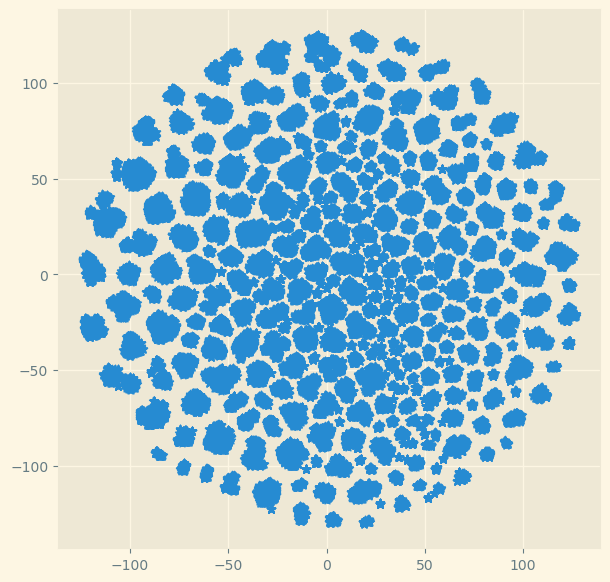

In [54]:
from sklearn.manifold import TSNE  # Import TSNE
import os
import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt



model = TSNE(n_components = 2, random_state = 0)
combined_df_modified = combined_df.select_dtypes(np.number)
tsne_data = model.fit_transform(combined_df_modified)
plt.style.use('Solarize_Light2')
plt.figure(figsize = (7, 7))
plt.scatter(tsne_data[:,0], tsne_data[:,1],  marker= '*')
plt.show()

In [55]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=10)
cat = km.fit_predict(numeric)
combined_df['cat'] = cat
norm_col('cat')

/var/folders/dt/68cxkpfx1wn0x87d0bc_x9wc0000gn/T/ipykernel_24192/3650481715.py:5: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [56]:
combined_df.cat[:10]

0    0.555556
1    0.555556
2    0.666667
3    0.777778
4    0.555556
5    0.333333
6    0.000000
7    0.666667
8    0.555556
9    0.777778
Name: cat, dtype: float64

In [57]:
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = combined_df.select_dtypes(np.number)
cluster_pipeline.fit(X)
combined_df['cluster'] = cluster_pipeline.predict(X)

/var/folders/dt/68cxkpfx1wn0x87d0bc_x9wc0000gn/T/ipykernel_24192/376565722.py:4: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [58]:
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['track_genre'] = spotify_knn['track_genre']
projection['cluster'] = combined_df['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'track_genre'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 81206 samples in 0.017s...
[t-SNE] Computed neighbors for 81206 samples in 7.138s...
[t-SNE] Computed conditional probabilities for sample 1000 / 81206
[t-SNE] Computed conditional probabilities for sample 2000 / 81206
[t-SNE] Computed conditional probabilities for sample 3000 / 81206
[t-SNE] Computed conditional probabilities for sample 4000 / 81206
[t-SNE] Computed conditional probabilities for sample 5000 / 81206
[t-SNE] Computed conditional probabilities for sample 6000 / 81206
[t-SNE] Computed conditional probabilities for sample 7000 / 81206
[t-SNE] Computed conditional probabilities for sample 8000 / 81206
[t-SNE] Computed conditional probabilities for sample 9000 / 81206
[t-SNE] Computed conditional probabilities for sample 10000 / 81206
[t-SNE] Computed conditional probabilities for sample 11000 / 81206
[t-SNE] Computed conditional probabilities for sample 12000 / 81206
[t-SNE] Computed conditional probabilities for sam

In [59]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
X = combined_df.select_dtypes(np.number).drop(columns = ['cat','cluster']).copy()
y = combined_df['cluster']

In [60]:
X_train, X_rem, y_train, y_rem = train_test_split(X,y, train_size=0.8, random_state=0)

X_valid, X_test, y_valid, y_test = train_test_split(X_rem,y_rem, test_size=0.5)

print(X_train.shape), print(y_train.shape)
print(X_valid.shape), print(y_valid.shape)
print(X_test.shape), print(y_test.shape)

(64964, 128)
(64964,)
(8121, 128)
(8121,)
(8121, 128)
(8121,)


(None, None)

In [75]:
knn1= KNeighborsClassifier(metric='cosine', algorithm='brute', n_neighbors=1)
knn5= KNeighborsClassifier(metric='cosine', algorithm='brute', n_neighbors=5)
knn10= KNeighborsClassifier(metric='cosine', algorithm='brute', n_neighbors=10)

In [76]:
knn5.fit(X_train, y_train)
knn1.fit(X_train, y_train)
knn10.fit(X_train, y_train)

# knn5.fit(X_valid, y_valid)
# knn1.fit(X_valid, y_valid)
# knn10.fit(X_valid, y_valid)

# knn5.fit(X_train, y_train)
# knn1.fit(X_train, y_train)
# knn10.fit(X_train, y_train)

y_pred_5 = knn5.predict(X_valid)
y_pred_1 = knn1.predict(X_valid)
y_pred_10 = knn1.predict(X_valid)

In [77]:
from sklearn.metrics import accuracy_score
print("Accuracy with k=5", accuracy_score(y_valid, y_pred_5)*100)
print("Accuracy with k=1", accuracy_score(y_valid, y_pred_1)*100)
print("Accuracy with k=10", accuracy_score(y_valid, y_pred_10)*100)

Accuracy with k=5 99.29811599556704
Accuracy with k=1 99.12572343307474
Accuracy with k=10 99.12572343307474


In [78]:
from sklearn.metrics import classification_report, confusion_matrix
print(confusion_matrix(y_valid, y_pred_1))
print(confusion_matrix(y_valid, y_pred_5))
print(confusion_matrix(y_valid, y_pred_10))

[[  87    0    0    0    0    0    0    0    0    0]
 [   0 1077    0    0    0    1    0    0    7    0]
 [   0    0   73    0    0    0    0    0    0    0]
 [   0    0    0  810    1    0    0    0    5    0]
 [   0    0    0    0  788    0    0    0    0    0]
 [   0    1    0    0    0 3716    0    0   19    0]
 [   0    0    0    0    0    0  104    0    0    0]
 [   0    0    0    0    0    0    0  348    0    0]
 [   0   10    0    2    0   25    0    0  612    0]
 [   0    0    0    0    0    0    0    0    0  435]]
[[  87    0    0    0    0    0    0    0    0    0]
 [   0 1080    0    0    0    1    0    0    4    0]
 [   0    0   73    0    0    0    0    0    0    0]
 [   0    0    0  813    1    0    0    0    2    0]
 [   0    0    0    0  788    0    0    0    0    0]
 [   0    0    0    0    0 3722    0    0   14    0]
 [   0    0    0    0    0    0  104    0    0    0]
 [   0    0    0    0    0    0    0  348    0    0]
 [   0    9    0    2    1   23    0    0  61

In [65]:
print(classification_report(y_valid, y_pred_1))
print(classification_report(y_valid, y_pred_5))
print(classification_report(y_valid, y_pred_10))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        87
           1       0.99      0.99      0.99      1085
           2       1.00      1.00      1.00        73
           3       1.00      0.99      1.00       816
           4       1.00      1.00      1.00       788
           5       0.99      0.99      0.99      3736
           6       1.00      1.00      1.00       104
           7       1.00      1.00      1.00       348
           8       0.95      0.94      0.95       649
           9       1.00      1.00      1.00       435

    accuracy                           0.99      8121
   macro avg       0.99      0.99      0.99      8121
weighted avg       0.99      0.99      0.99      8121

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        87
           1       0.99      1.00      0.99      1085
           2       1.00      1.00      1.00        73
           3       1.00 

In [66]:
tsne_model = TSNE(n_components = 2, random_state = 0)
tsne_data_X_valid = tsne_model.fit_transform(X_test)

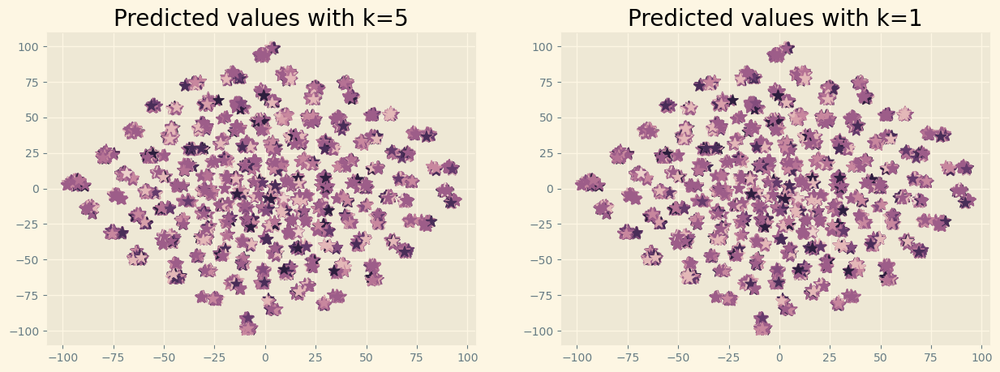

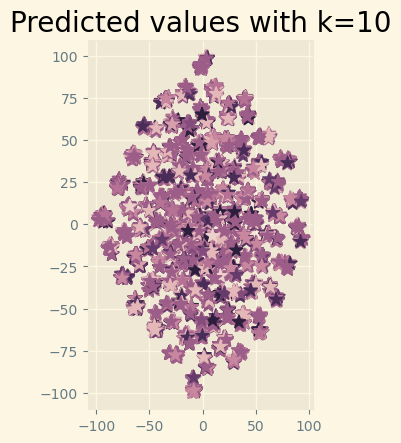

In [67]:
cmap = sns.cubehelix_palette(as_cmap=True)
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
plt.scatter(tsne_data_X_valid[:,0], tsne_data_X_valid[:,1], c=y_pred_5, marker= '*', s=100, cmap=cmap)
plt.title("Predicted values with k=5", fontsize=20)
plt.subplot(1,2,2)
plt.scatter(tsne_data_X_valid[:,0], tsne_data_X_valid[:,1], c=y_pred_1, marker= '*', s=100, cmap=cmap)
plt.title("Predicted values with k=1", fontsize=20)
plt.show()
plt.subplot(1,2,2)
plt.scatter(tsne_data_X_valid[:,0], tsne_data_X_valid[:,1], c=y_pred_10, marker= '*', s=100, cmap=cmap)
plt.title("Predicted values with k=10", fontsize=20)
plt.show()

In [68]:

from fuzzywuzzy import process
X_test

/opt/anaconda3/lib/python3.12/site-packages/fuzzywuzzy/fuzz.py:11: UserWarning:

Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning



,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,sad,party,latin,metalcore,minimal-techno,mandopop,disney,electro,goth,iranian,brazil,detroit-techno,dancehall,trance,happy,j-pop,techno,spanish,black-metal,swedish,malay,garage,indie,drum-and-bass,gospel,trip-hop,funk,mpb,heavy-metal,alt-rock,sertanejo,hip-hop,romance,classical,j-idol,rock,pagode,death-metal,punk-rock,kids,edm,psych-rock,jazz,anime,world-music,grindcore,blues,honky-tonk,rockabilly,punk,tango,children,comedy,synth-pop,alternative,singer-songwriter,soul,indie-pop,bluegrass,disco,piano,j-dance,industrial,guitar,folk,grunge,breakbeat,rock-n-roll,groove,samba,hardcore,deep-house,electronic,dance,study,opera,progressive-house,british,country,ska,power-pop,new-age,sleep,house,chicago-house,pop,turkish,afrobeat,reggaeton,k-pop,reggae,hardstyle,metal,salsa,emo,j-rock,indian,show-tunes,acoustic,pop-film,idm,chill,latino,cantopop,german,hard-rock,club,r-n-b,french,forro,dubstep,ambient,dub
19528,0.19,0.029445,0.0,0.277157,0.650,0.090909,0.811165,0.0,0.046425,0.371486,0.000005,0.8380,0.135678,0.328616,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10809,0.06,0.013081,0.0,0.822335,0.551,0.909091,0.677358,0.0,0.238342,0.877510,0.929000,0.1150,0.622111,0.698445,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22534,0.75,0.038569,0.0,0.418274,0.940,0.090909,0.876015,1.0,0.222798,0.065060,0.000000,0.3580,0.425126,0.649064,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20797,0.30,0.044603,0.0,0.831472,0.908,0.636364,0.798716,0.0,0.065699,0.271084,0.002000,0.3640,0.917588,0.452546,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9705,0.40,0.036274,0.0,0.275127,0.743,0.181818,0.789764,1.0,0.054715,0.093373,0.000001,0.1490,0.485427,0.540510,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [69]:
recommendation_set = combined_df.merge(X_test, how = 'inner' ,indicator=False)
recommendation_set

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,sad,party,latin,metalcore,minimal-techno,mandopop,disney,electro,goth,iranian,brazil,detroit-techno,dancehall,trance,happy,j-pop,techno,spanish,black-metal,swedish,malay,garage,indie,drum-and-bass,gospel,trip-hop,funk,mpb,heavy-metal,alt-rock,sertanejo,hip-hop,romance,classical,j-idol,rock,pagode,death-metal,punk-rock,kids,edm,psych-rock,jazz,anime,world-music,grindcore,blues,honky-tonk,rockabilly,punk,tango,children,comedy,synth-pop,alternative,singer-songwriter,soul,indie-pop,bluegrass,disco,piano,j-dance,industrial,guitar,folk,grunge,breakbeat,rock-n-roll,groove,samba,hardcore,deep-house,electronic,dance,study,opera,progressive-house,british,country,ska,power-pop,new-age,sleep,house,chicago-house,pop,turkish,afrobeat,reggaeton,k-pop,reggae,hardstyle,metal,salsa,emo,j-rock,indian,show-tunes,acoustic,pop-film,idm,chill,latino,cantopop,german,hard-rock,club,r-n-b,french,forro,dubstep,ambient,dub,cat,cluster
0,5ezuHIXXlsPQY4rbsSKT1W,Laura Osnes,Rodgers + Hammerstein's Cinderella (Original B...,"""He Was Tall""",0.27,0.015706,0.0,0.339086,0.2550,0.181818,0.691989,1.0,0.055026,0.898594,0.000000,0.125,0.123618,0.321319,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,7
1,5Nvjrz2qYEvOg7U189N89W,Michael Cerveris;Beth Malone,Fun Home (A New Broadway Musical),"""It Was Great to Have You Home...""",0.22,0.008229,0.0,0.479188,0.2680,1.000000,0.651832,0.0,0.245596,0.818273,0.000000,0.497,0.562814,0.534544,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,7
2,5mPQOKM56h6IzG3oxK2C1a,When Chai Met Toast,'Hop Stomp','Hop Stomp',0.36,0.030106,0.0,0.689340,0.7610,0.363636,0.794573,1.0,0.033990,0.496988,0.000281,0.148,0.781910,0.493233,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.555556,4
3,3HhEScV90AFQ3HoNcXsJjb,Hank Williams,The Complete Hank Williams,'Neath A Cold Gray Tomb Of Stone,0.13,0.029193,0.0,0.600000,0.3730,0.000000,0.723896,1.0,0.031399,0.982932,0.000951,0.359,0.640201,0.550215,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.555556,4
4,1qUdmikV7AoqFaOBPQg3ck,Baden Powell,Three Originals: Tristeza on Guitar / Poema on...,'Round Midnight,0.22,0.061971,0.0,0.397970,0.0859,0.272727,0.533877,0.0,0.045181,0.969880,0.870000,0.104,

In [70]:
def recommender(song_name, data,model):
    idx=process.extractOne(song_name, recommendation_set['track_name'])[2]
    print('Song Selected:-',recommendation_set['track_name'][idx], 'Index: ',idx)
    print('Searching for recommendations.....')
    requiredSongs = recommendation_set.select_dtypes(np.number).drop(columns = ['cat','cluster']).copy()
    distances, indices = model.kneighbors(requiredSongs.iloc[idx].values.reshape(1,-1))
    for i in indices:
        print(combined_df['track_name'][i] + "      " + combined_df['artists'][i])

In [71]:
def get_song_info(row_number):
    song_info = recommendation_set.loc[row_number, ["track_name", "artists"]]
    return song_info

song_info = get_song_info(0)
print("Song name: ", song_info["track_name"])
print("Artist name: ", song_info["artists"])

Song name:  "He Was Tall"
Artist name:  Laura Osnes


In [72]:
song_name = song_info["track_name"]
song_name = "The Riddle"
recommender(song_name,X_test, knn5)

Song Selected:- 'til The End Of The World Rolls 'round Index:  5
Searching for recommendations.....
14983      Dance, Motherfucker, Dance!      Violent Femmes
64098                 Take It Or Leave It      The Strokes
54966             Remembrance - Live      Hillsong Worship
54025                Rain in Forest      Baby Sleep Sounds
38740    Lloró Como una Mujer (with Leopoldo Federico y...
dtype: object


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names

